In [ ]:
import os
import geopandas as gpd
import pandas as pd
from google.colab import drive
from IPython.display import display
!pip install fiona

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 86.6 MB/s eta 0:00:00


In [ ]:
from fiona import listlayers
drive.mount('/content/drive')
link_world_map = "/content/drive/My Drive/SHAPEFILE/MAPA6362.gpkg"
listlayers(link_world_map)

Mounted at /content/drive


['México',
 'Estados de México',
 'Municipios de México',
 'Ríos de México',
 'Estados_de_México',
 'Municipalidades_de_México',
 'aeropuerto',
 'Aereopuertos de Mexico',
 'aaeropuertointento']

In [ ]:
mexico_municipalities=gpd.read_file(link_world_map,layer='Municipalidades_de_México')


In [ ]:
mexico_municipalities.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2475 entries, 0 to 2474
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   CVEGEO     2475 non-null   object  
 1   CVE_ENT    2475 non-null   object  
 2   CVE_MUN    2475 non-null   object  
 3   NOMGEO     2475 non-null   object  
 4   NOM_ENT    2475 non-null   object  
 5   COV_       2475 non-null   int64   
 6   COV_ID     2475 non-null   int64   
 7   AREA       2475 non-null   float64 
 8   PERIMETER  2475 non-null   float64 
 9   geometry   2475 non-null   geometry
dtypes: float64(2), geometry(1), int64(2), object(5)
memory usage: 193.5+ KB


In [ ]:
mexico_municipalities

,CVEGEO,CVE_ENT,CVE_MUN,NOMGEO,NOM_ENT,COV_,COV_ID,AREA,PERIMETER,geometry
0,01008,01,008,San JosÃ© de Gracia,Aguascalientes,0,1,857.790574,181.537599,"MULTIPOLYGON (((2453326.553 1143576.423, 24533..."
1,01009,01,009,TepezalÃ¡,Aguascalientes,1,2,229.661012,89.329532,"MULTIPOLYGON (((2481826.447 1149055.253, 24815..."
2,01007,01,007,RincÃ³n de Romos,Aguascalientes,2,3,372.295163,161.749880,"MULTIPOLYGON (((2476760.231 1150329.045, 24767..."
3,01006,01,006,PabellÃ³n de Arteaga,Aguascalientes,3,4,195.735946,105.612997,"MULTIPOLYGON (((2473996.656 1129304.114, 24742..."
4,01005,01,005,JesÃºs MarÃ­a,Aguascalientes,4,5,499.895092,163.500811,"MULTIPOLYGON (((2463657.764 1116053.82, 246373..."
...,...,...,...,...,...,...,...,...,...,...
2470,32029,32,029,Miguel Auza,Zacatecas,2470,2471,1093.921188,183.913765,"MULTIPOLYGON (((2355465.893 1369546.77, 235554..."
2471,32028,32,028,Mezquital del Oro,Zacatecas,2471,2472,482.008504,146.234897,"MULTIPOLYGON (((2367118.716 1037654.815, 23671..."
2472,32011,32,011,Trinidad GarcÃ­a de la Cadena,Zacatecas,2472,2473,304.265670,105.480166,"MULTIPOLYGON (((2351804.877 1035949.877, 23518..."
2473,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732..."


In [ ]:
link_cvs='/content/drive/MyDrive/SHAPEFILE/municipios_poblacion.csv'
poblacion2010=pd.read_csv(link_cvs, encoding='latin1')

In [ ]:
poblacion2010.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2456 entries, 0 to 2455
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   EntidadID    2456 non-null   int64 
 1   MunicipioID  2456 non-null   int64 
 2   Municipio    2456 non-null   object
 3   Poblacion    2456 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 76.9+ KB


In [ ]:
poblacion2010

,EntidadID,MunicipioID,Municipio,Poblacion
0,1,1,Aguascalientes,797010
1,1,2,Asientos,45492
2,1,3,Calvillo,54136
3,1,4,Cosío,15042
4,1,5,Jesús María,99590
...,...,...,...,...
2451,32,54,Villa Hidalgo,18490
2452,32,55,Villanueva,29395
2453,32,56,Zacatecas,138176
2454,32,57,Trancoso,16934


In [ ]:
mexico_municipalities.merge(poblacion2010,left_on='NOMGEO',right_on='Municipio')

#vemos que se pierden datos

,CVEGEO,CVE_ENT,CVE_MUN,NOMGEO,NOM_ENT,COV_,COV_ID,AREA,PERIMETER,geometry,EntidadID,MunicipioID,Municipio,Poblacion
0,01003,01,003,Calvillo,Aguascalientes,6,7,923.357832,171.636168,"MULTIPOLYGON (((2429646.495 1120918.059, 24297...",1,3,Calvillo,54136
1,01002,01,002,Asientos,Aguascalientes,7,8,543.374266,192.096428,"MULTIPOLYGON (((2493552.647 1142361.087, 24935...",1,2,Asientos,45492
2,01001,01,001,Aguascalientes,Aguascalientes,8,9,1166.359247,256.631026,"MULTIPOLYGON (((2486536.885 1117403.247, 24872...",1,1,Aguascalientes,797010
3,01010,01,010,El Llano,Aguascalientes,9,10,504.050989,144.866490,"MULTIPOLYGON (((2496481.299 1116760.454, 24966...",1,10,El Llano,18828
4,01011,01,011,San Francisco de los Romo,Aguascalientes,10,11,137.770177,103.689066,"MULTIPOLYGON (((2483638.349 1120034.022, 24839...",1,11,San Francisco de los Romo,35769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",15,53,Melchor Ocampo,50240
1887,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",19,35,Melchor Ocampo,862
1888,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",32,27,Melchor Ocampo,2662
1889,32024,32,024,Loreto,Zacatecas,2474,2475,424.658188,136.687153,"MULTIPOLYGON (((2487234.035 1151121.912, 24873...",3,9,Loreto,16738


In [ ]:
solomunicipalidades=set(mexico_municipalities.NOMGEO)-set(poblacion2010.Municipio)
solopoblacion=set(poblacion2010.Municipio)-set(mexico_municipalities.NOMGEO)

In [ ]:
!pip install thefuzz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.2 MB/s eta 0:00:00


In [ ]:
from thefuzz import process as fz
[(c,fz.extractOne(c,solomunicipalidades)) for c in sorted(solopoblacion)] #estos son los datos que podemos recuperar

[('Abalá', ('AbalÃ¡', 100)),
 ('Acambay', ('Acambay de RuÃ\xadz CastaÃ±eda', 90)),
 ('Acapulco de Juárez', ('Acapulco de JuÃ¡rez', 100)),
 ('Acatlán', ('AcatlÃ¡n', 100)),
 ('Acatlán de Juárez', ('AcatlÃ¡n de JuÃ¡rez', 100)),
 ('Acatlán de Pérez Figueroa', ('AcatlÃ¡n de PÃ©rez Figueroa', 100)),
 ('Acaxochitlán', ('AcaxochitlÃ¡n', 100)),
 ('Acuña', ('AcuÃ±a', 100)),
 ('Acámbaro', ('AcÃ¡mbaro', 100)),
 ('Ahuacatlán', ('AhuacatlÃ¡n', 100)),
 ('Ahualulco', ('Ahualulco del Sonido 13', 90)),
 ('Ahuatlán', ('AhuatlÃ¡n', 100)),
 ('Ajuchitlán del Progreso', ('AjuchitlÃ¡n del Progreso', 100)),
 ('Alamos', ('Ã\x81lamos', 91)),
 ('Almoloya de Juárez', ('Almoloya de JuÃ¡rez', 100)),
 ('Almoloya del Río', ('Almoloya del RÃ\xado', 100)),
 ('Alpatláhuac', ('AlpatlÃ¡huac', 100)),
 ('Alto Lucero de Gutiérrez Barrios',
  ('Alto Lucero de GutiÃ©rrez Barrios', 100)),
 ('Amatitlán', ('AmatitlÃ¡n', 100)),
 ('Amatitán', ('AmatitÃ¡n', 100)),
 ('Amatlán de Cañas', ('AmatlÃ¡n de CaÃ±as', 100)),
 ('Amatlán de los 

In [ ]:
changes={c:fz.extractOne(c, solomunicipalidades)[0]
                 for c in sorted(solopoblacion)
                 if fz.extractOne(c, solomunicipalidades)[1]>90}
changes #creamos un diccionario con los datos que tenga una coincidencia mayor a 90%

{'Abalá': 'AbalÃ¡',
 'Acapulco de Juárez': 'Acapulco de JuÃ¡rez',
 'Acatlán': 'AcatlÃ¡n',
 'Acatlán de Juárez': 'AcatlÃ¡n de JuÃ¡rez',
 'Acatlán de Pérez Figueroa': 'AcatlÃ¡n de PÃ©rez Figueroa',
 'Acaxochitlán': 'AcaxochitlÃ¡n',
 'Acuña': 'AcuÃ±a',
 'Acámbaro': 'AcÃ¡mbaro',
 'Ahuacatlán': 'AhuacatlÃ¡n',
 'Ahuatlán': 'AhuatlÃ¡n',
 'Ajuchitlán del Progreso': 'AjuchitlÃ¡n del Progreso',
 'Alamos': 'Ã\x81lamos',
 'Almoloya de Juárez': 'Almoloya de JuÃ¡rez',
 'Almoloya del Río': 'Almoloya del RÃ\xado',
 'Alpatláhuac': 'AlpatlÃ¡huac',
 'Alto Lucero de Gutiérrez Barrios': 'Alto Lucero de GutiÃ©rrez Barrios',
 'Amatitlán': 'AmatitlÃ¡n',
 'Amatitán': 'AmatitÃ¡n',
 'Amatlán de Cañas': 'AmatlÃ¡n de CaÃ±as',
 'Amatlán de los Reyes': 'AmatlÃ¡n de los Reyes',
 'Amatán': 'AmatÃ¡n',
 'Amixtlán': 'AmixtlÃ¡n',
 'Angel Albino Corzo': 'Ã\x81ngel Albino Corzo',
 'Anáhuac': 'AnÃ¡huac',
 'Apatzingán': 'ApatzingÃ¡n',
 'Apetatitlán de Antonio Carvajal': 'ApetatitlÃ¡n de Antonio Carvajal',
 'Aquiles Serdán': '

In [ ]:

poblacion2010['Municipio'] = poblacion2010['Municipio'].map(changes).fillna(poblacion2010['Municipio'])
mexico_municipalities.merge(poblacion2010,left_on='NOMGEO',right_on='Municipio')

,CVEGEO,CVE_ENT,CVE_MUN,NOMGEO,NOM_ENT,COV_,COV_ID,AREA,PERIMETER,geometry,EntidadID,MunicipioID,Municipio,Poblacion
0,01008,01,008,San JosÃ© de Gracia,Aguascalientes,0,1,857.790574,181.537599,"MULTIPOLYGON (((2453326.553 1143576.423, 24533...",1,8,San JosÃ© de Gracia,8443
1,01009,01,009,TepezalÃ¡,Aguascalientes,1,2,229.661012,89.329532,"MULTIPOLYGON (((2481826.447 1149055.253, 24815...",1,9,TepezalÃ¡,19668
2,01007,01,007,RincÃ³n de Romos,Aguascalientes,2,3,372.295163,161.749880,"MULTIPOLYGON (((2476760.231 1150329.045, 24767...",1,7,RincÃ³n de Romos,49156
3,01006,01,006,PabellÃ³n de Arteaga,Aguascalientes,3,4,195.735946,105.612997,"MULTIPOLYGON (((2473996.656 1129304.114, 24742...",1,6,PabellÃ³n de Arteaga,41862
4,01005,01,005,JesÃºs MarÃ­a,Aguascalientes,4,5,499.895092,163.500811,"MULTIPOLYGON (((2463657.764 1116053.82, 246373...",1,5,JesÃºs MarÃ­a,99590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2888,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",15,53,Melchor Ocampo,50240
2889,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",19,35,Melchor Ocampo,862
2890,32027,32,027,Melchor Ocampo,Zacatecas,2473,2474,1862.048602,247.933775,"MULTIPOLYGON (((2470352.986 1453426.983, 24732...",32,27,Melchor Ocampo,2662
2891,32024,32,024,Loreto,Zacatecas,2474,2475,424.658188,136.687153,"MULTIPOLYGON (((2487234.035 1151121.912, 24873...",3,9,Loreto,16738


In [ ]:
# eliminamos las municipalidades repetidas del merge

mexico_municipalities.drop_duplicates(subset='NOMGEO', keep='first', inplace=True)
merged_data = mexico_municipalities.merge(poblacion2010, left_on='NOMGEO', right_on='Municipio')
merged_data

,CVEGEO,CVE_ENT,CVE_MUN,NOMGEO,NOM_ENT,COV_,COV_ID,AREA,PERIMETER,geometry,EntidadID,MunicipioID,Municipio,Poblacion
0,01008,01,008,San JosÃ© de Gracia,Aguascalientes,0,1,857.790574,181.537599,"MULTIPOLYGON (((2453326.553 1143576.423, 24533...",1,8,San JosÃ© de Gracia,8443
1,01009,01,009,TepezalÃ¡,Aguascalientes,1,2,229.661012,89.329532,"MULTIPOLYGON (((2481826.447 1149055.253, 24815...",1,9,TepezalÃ¡,19668
2,01007,01,007,RincÃ³n de Romos,Aguascalientes,2,3,372.295163,161.749880,"MULTIPOLYGON (((2476760.231 1150329.045, 24767...",1,7,RincÃ³n de Romos,49156
3,01006,01,006,PabellÃ³n de Arteaga,Aguascalientes,3,4,195.735946,105.612997,"MULTIPOLYGON (((2473996.656 1129304.114, 24742...",1,6,PabellÃ³n de Arteaga,41862
4,01005,01,005,JesÃºs MarÃ­a,Aguascalientes,4,5,499.895092,163.500811,"MULTIPOLYGON (((2463657.764 1116053.82, 246373...",1,5,JesÃºs MarÃ­a,99590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2423,32033,32,033,Moyahua de Estrada,Zacatecas,2468,2469,535.272259,146.517695,"MULTIPOLYGON (((2374490.807 1036859.485, 23745...",32,33,Moyahua de Estrada,4563
2424,32031,32,031,Monte Escobedo,Zacatecas,2469,2470,1582.976177,290.315815,"MULTIPOLYGON (((2358014.128 1182803.876, 23580...",32,31,Monte Escobedo,8929
2425,32029,32,029,Miguel Auza,Zacatecas,2470,2471,1093.921188,183.913765,"MULTIPOLYGON (((2355465.893 1369546.77, 235554...",32,29,Miguel Auza,22296
2426,32028,32,028,Mezquital del Oro,Zacatecas,2471,2472,482.008504,146.234897,"MULTIPOLYGON (((2367118.716 1037654.815, 23671...",32,28,Mezquital del Oro,2584


In [ ]:
merged_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2428 entries, 0 to 2427
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   CVEGEO       2428 non-null   object  
 1   CVE_ENT      2428 non-null   object  
 2   CVE_MUN      2428 non-null   object  
 3   NOMGEO       2428 non-null   object  
 4   NOM_ENT      2428 non-null   object  
 5   COV_         2428 non-null   int64   
 6   COV_ID       2428 non-null   int64   
 7   AREA         2428 non-null   float64 
 8   PERIMETER    2428 non-null   float64 
 9   geometry     2428 non-null   geometry
 10  EntidadID    2428 non-null   int64   
 11  MunicipioID  2428 non-null   int64   
 12  Municipio    2428 non-null   object  
 13  Poblacion    2428 non-null   int64   
dtypes: float64(2), geometry(1), int64(5), object(6)
memory usage: 265.7+ KB


In [ ]:
# eliminar algunas columnas

merged_data = merged_data.drop(columns=['NOM_ENT', 'EntidadID', 'MunicipioID', 'Municipio'])
merged_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2428 entries, 0 to 2427
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   CVEGEO     2428 non-null   object  
 1   CVE_ENT    2428 non-null   object  
 2   CVE_MUN    2428 non-null   object  
 3   NOMGEO     2428 non-null   object  
 4   COV_       2428 non-null   int64   
 5   COV_ID     2428 non-null   int64   
 6   AREA       2428 non-null   float64 
 7   PERIMETER  2428 non-null   float64 
 8   geometry   2428 non-null   geometry
 9   Poblacion  2428 non-null   int64   
dtypes: float64(2), geometry(1), int64(3), object(4)
memory usage: 189.8+ KB


In [ ]:
POPULATION = merged_data.groupby("CVE_ENT")["Poblacion"].sum().reset_index()
POPULATION

,CVE_ENT,Poblacion
0,01,1203630
1,02,3263861
2,03,939236
3,04,838533
4,05,5567537
5,06,1506780
6,07,6032737
7,08,2749943
8,09,8634139
9,10,1948356


PREGUNTA 6

Compute the neighbors of the capital city of your country. Plot the results for each of the options.

In [ ]:
mexico_estados=gpd.read_file(link_world_map,layer='Estados de México')
mexico_estados.head()

,CVEGEO,CVE_ENT,NOMGEO,CVE_CAP,NOM_CAP,COV_,COV_ID,AREA,PERIMETER,geometry
0,01,01,Aguascalientes,10001,Aguascalientes,0,1,5558.673843,423.005983,"MULTIPOLYGON (((2469550.852 1159302.642, 24697..."
1,02,02,Baja California,20001,Mexicali,1,2,73406.158609,3104.096911,"MULTIPOLYGON (((1313480.513 1831458.607, 13135..."
2,03,03,Baja California Sur,30001,La Paz,2,3,71407.136932,5094.093396,"MULTIPOLYGON (((1694656.344 1227647.637, 16946..."
3,04,04,Campeche,20001,San Francisco de Campeche,3,4,57269.828744,1566.405110,"MULTIPOLYGON (((3544897.199 946994.621, 354491..."
4,05,05,Coahuila de Zaragoza,300001,Saltillo,4,5,150671.222993,2414.885297,"MULTIPOLYGON (((2469501.165 1978862.429, 24695..."


In [ ]:
#tras sacar una tabla con sólo cve_ent (número que identifica a cada estado) y población, se puede hacer un merge entre esas dos para añadir la variable poblacion al mexico_estados
mexico_estados = mexico_estados.merge(POPULATION, on="CVE_ENT", how="left")
mexico_estados

,CVEGEO,CVE_ENT,NOMGEO,CVE_CAP,NOM_CAP,COV_,COV_ID,AREA,PERIMETER,geometry,Poblacion
0,01,01,Aguascalientes,10001,Aguascalientes,0,1,5558.673843,423.005983,"MULTIPOLYGON (((2469550.852 1159302.642, 24697...",1203630
1,02,02,Baja California,20001,Mexicali,1,2,73406.158609,3104.096911,"MULTIPOLYGON (((1313480.513 1831458.607, 13135...",3263861
2,03,03,Baja California Sur,30001,La Paz,2,3,71407.136932,5094.093396,"MULTIPOLYGON (((1694656.344 1227647.637, 16946...",939236
3,04,04,Campeche,20001,San Francisco de Campeche,3,4,57269.828744,1566.405110,"MULTIPOLYGON (((3544897.199 946994.621, 354491...",838533
4,05,05,Coahuila de Zaragoza,300001,Saltillo,4,5,150671.222993,2414.885297,"MULTIPOLYGON (((2469501.165 1978862.429, 24695...",5567537
5,06,06,Colima,20001,Colima,5,6,5754.122698,643.626162,"MULTIPOLYGON (((1157633.318 768573.524, 115772...",1506780
6,07,07,Chiapas,1010001,Tuxtla GutiÃ©rrez,6,7,73617.359026,1779.550589,"MULTIPOLYGON (((3558179.783 698365.65, 3558487...",6032737
7,08,08,Chihuahua,190001,Chihuahua,7,8,246973.359987,3120.465637,"MULTIPOLYGON (((1915797.897 2202988.59, 191603...",2749943
8,09,09,Ciudad de MÃ©xico,0,None,8,9,1486.183217,206.876266,"MULTIPOLYGON (((2800966.25 846721.791, 2801109...",8634139
9,10,10,Durango,50001,Victoria de Durango,9,10,122131.204862,2500.703505,"MULTIPOLYGON (((2100516.1 1647595.689, 2100677...",1948356


In [ ]:

mexico_estados[mexico_estados['NOMGEO'].str.contains('ciudad', case=False, na=False)] #ubicamos la capital de México


,CVEGEO,CVE_ENT,NOMGEO,CVE_CAP,NOM_CAP,COV_,COV_ID,AREA,PERIMETER,geometry,Poblacion
8,09,09,Ciudad de MÃ©xico,0,None,8,9,1486.183217,206.876266,"MULTIPOLYGON (((2800966.25 846721.791, 2801109...",8634139


In [ ]:
from libpysal.weights import Queen, Rook, KNN

In [ ]:
#Primera opcion para determinar los vecinos de Ciudad de Mexico
#Usamos Rook
w_rook = Rook.from_dataframe(mexico_estados,use_index=False)

/usr/local/lib/python3.11/dist-packages/libpysal/weights/contiguity.py:61: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There is 1 island with id: 2.
  W.__init__(self, neighbors, ids=ids, **kw)


In [ ]:
mexico_estados.iloc[w_rook.neighbors[8] ,] #observamos los vecinos de la capital

,CVEGEO,CVE_ENT,NOMGEO,CVE_CAP,NOM_CAP,COV_,COV_ID,AREA,PERIMETER,geometry,Poblacion
16,17,17,Morelos,70001,Cuernavaca,16,17,4859.413834,456.475505,"MULTIPOLYGON (((2787908.78 793921.949, 2791085...",1462994
14,15,15,MÃ©xico,1060001,Toluca de Lerdo,14,15,22226.853420,1446.711214,"MULTIPOLYGON (((2717218.9 921748.845, 2717277....",14579173


<Axes: >

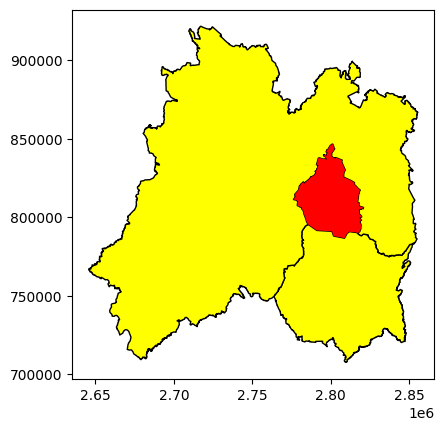

In [ ]:
#Graficamos los vecinos de la capital
base=mexico_estados.iloc[w_rook.neighbors[8] ,].plot(facecolor="yellow",edgecolor='k')
mexico_estados.loc[mexico_estados.NOMGEO=='Ciudad de MÃ©xico'].plot(ax=base,facecolor="red")

In [ ]:
#Segunda opcion para determinar los vecinos de Ciudad de Mexico
#Usamos Queen
w_queen = Queen.from_dataframe(mexico_estados,use_index=False)

/usr/local/lib/python3.11/dist-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)


In [ ]:
mexico_estados.iloc[w_queen.neighbors[8] ,] #observamos los vecinos

,CVEGEO,CVE_ENT,NOMGEO,CVE_CAP,NOM_CAP,COV_,COV_ID,AREA,PERIMETER,geometry,Poblacion
16,17,17,Morelos,70001,Cuernavaca,16,17,4859.413834,456.475505,"MULTIPOLYGON (((2787908.78 793921.949, 2791085...",1462994
14,15,15,MÃ©xico,1060001,Toluca de Lerdo,14,15,22226.853420,1446.711214,"MULTIPOLYGON (((2717218.9 921748.845, 2717277....",14579173


<Axes: >

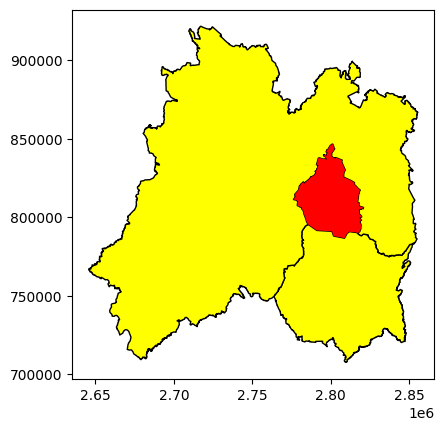

In [ ]:
base=mexico_estados.iloc[w_queen.neighbors[8] ,].plot(facecolor="yellow",edgecolor='k')
mexico_estados.loc[mexico_estados.NOMGEO=='Ciudad de MÃ©xico'].plot(ax=base,facecolor="red") # graficamos los vecinos de la capital

In [ ]:
#Tercera opcion para determinar los vecinos de Ciudad de Mexico
#Usamos KNN
w_knn8 = KNN.from_dataframe(mexico_estados, k=8)

In [ ]:
w_knn8.neighbors[8] # los 8 vecinos más cercanos a la capital de Mexico

[np.int64(14),
 np.int64(16),
 np.int64(28),
 np.int64(20),
 np.int64(12),
 np.int64(21),
 np.int64(11),
 np.int64(10)]

<Axes: >

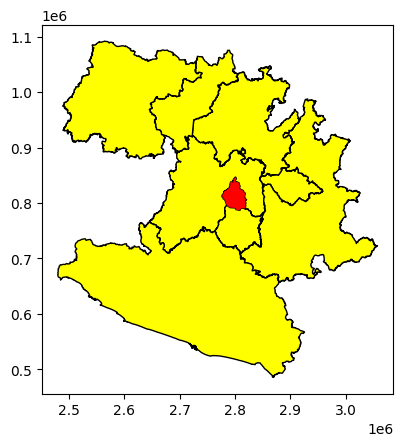

In [ ]:
base=mexico_estados.iloc[w_knn8.neighbors[8] ,].plot(facecolor="yellow",edgecolor='k')
mexico_estados.loc[mexico_estados.NOMGEO=='Ciudad de MÃ©xico'].plot(ax=base,facecolor="red")

PREGUNTA 7

In [ ]:
#a) Compute the Moran's coefficient for one of your three numeric variables.

In [ ]:
#Se obtiene la matriz de peso para knn8, sabiendo que 1 significa que son vecinos.
matriz_peso=pd.DataFrame(*w_knn8.full())
matriz_peso.head()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [ ]:
#normalizar para moran
w_knn8.transform = 'R'
#resultado de normalizar
pd.DataFrame(*w_knn8.full()).sum(axis=1).head()

,0
0,1.0
1,1.0
2,1.0
3,1.0
4,1.0


In [ ]:
!pip install esda

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.8/142.8 kB 2.8 MB/s eta 0:00:00


In [ ]:
#Usando la variable numerica area para sacar el moran
from esda.moran import Moran

moranAREA = Moran(mexico_estados['AREA'], w_knn8)
moranAREA.I,moranAREA.p_sim

(np.float64(0.32671222864047306), np.float64(0.001))

In [ ]:
#el primer valor mide cuanta correlación hay:
#"Si Moran’s I > 0 → los valores similares están agrupados (por ejemplo, zonas de alto IDH cerca de otras de alto IDH).
#Si Moran’s I ≈ 0 → los valores están distribuidos aleatoriamente.
#Si Moran’s I < 0 → los valores diferentes están cerca unos de otros (dispersión)."
#el segundo si la correlación es real o por azar: "Menor a 0.05 significa sí hay autocorrelación espacial significativa. Mayor, es que probablemente es el azar"
#Entonces, como MoranI es positivo y moderadamente alto, los estados con valores similares de AREA tienden a estar cerca unos de otros.
#Además, como p es muy bajo, es muy poco probable que esa tendencia sea azar, por lo que es estadísticamente significativo.

In [ ]:
#b)Make a scatter plot for each variable.

In [ ]:
!pip install splot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.8/322.8 kB 18.9 MB/s eta 0:00:00


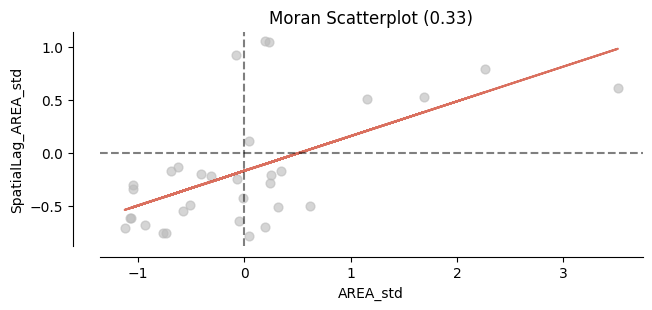

In [ ]:
#el scatter plot para area, eje x valores de area estandarizados, eje y promedio de area de los vecinos osea lag espacial:
from splot.esda import moran_scatterplot

fig, ax = moran_scatterplot(moranAREA, aspect_equal=True)
ax.set_xlabel('AREA_std')
ax.set_ylabel('SpatialLag_AREA_std');

In [ ]:
#Para perimetro:
#Moran
moranPERIMETER = Moran(mexico_estados['PERIMETER'], w_knn8)
moranPERIMETER.I,moranPERIMETER.p_sim
#Entonces, como MoranI es positivo y moderadamente alto, los estados con valores similares de PERIMETRO tienden a estar cerca unos de otros.
#Además, como p es muy bajo, es muy poco probable que esa tendencia sea azar, por lo que es estadísticamente significativo.

(np.float64(0.20973250574526764), np.float64(0.003))

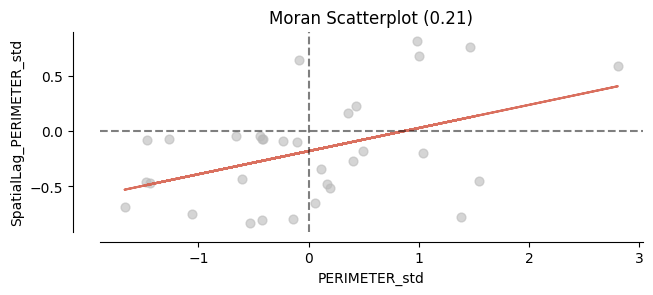

In [ ]:
#Scatter plot de perimetro, eje x valores de perimetro estandarizados, eje y promedio de perimetro de los vecinos osea lag espacial:
fig, ax = moran_scatterplot(moranPERIMETER, aspect_equal=True)
ax.set_xlabel('PERIMETER_std')
ax.set_ylabel('SpatialLag_PERIMETER_std');

In [ ]:
#Para poblacion:
#Moran
moranPOPULATION = Moran(mexico_estados['Poblacion'], w_knn8)
moranPOPULATION.I,moranPOPULATION.p_sim
#Entonces, como MoranI es positivo y muy cercano a 0, los estados con valores similares de POBLACIÓN no tienen un patrón fuerte de agrupamiento ni de dispersión.
#Además, como p es muy alto, no es estadísticamente significativo y se puede concluir que no hay un agrupamiento espacial real, el patrón puede explicarse con azar.

(np.float64(0.037916741106930475), np.float64(0.114))

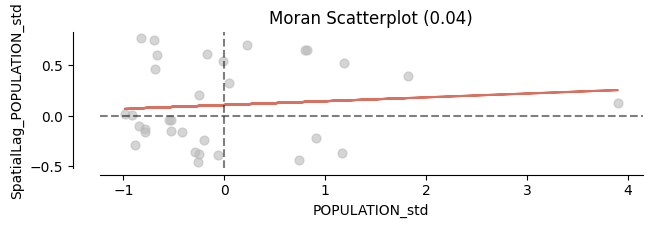

In [ ]:
#Scatter plot de poblacion, eje x valores de poblacion estandarizados, eje y promedio de poblacion de los vecinos osea lag espacial:
fig, ax = moran_scatterplot(moranPOPULATION, aspect_equal=True)
ax.set_xlabel('POPULATION_std')
ax.set_ylabel('SpatialLag_POPULATION_std');

PREGUNTA 8

In [ ]:
#a)Compute the Local Moran for the variables in your data that have significant spatial correlation.

In [ ]:
#Para este ejercicio solo debemos trabajar con AREA y PERIMETER.

In [ ]:
#LISA para cada estado usando area y perimetro
from esda.moran import Moran_Local
lisaAREA = Moran_Local(y=mexico_estados['AREA'], w=w_knn8,seed=69)
lisaPERIMETER = Moran_Local(y=mexico_estados['PERIMETER'], w=w_knn8,seed=69)

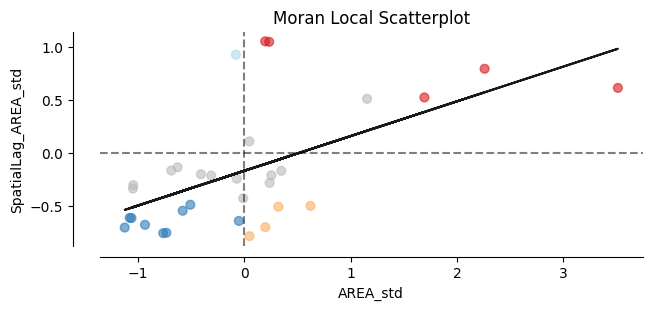

In [ ]:
#Si el punto no es gris entonces el LISA es significativo
#para area
fig, ax = moran_scatterplot(lisaAREA,p=0.05)
ax.set_xlabel('AREA_std')
ax.set_ylabel('SpatialLag_AREA_std');

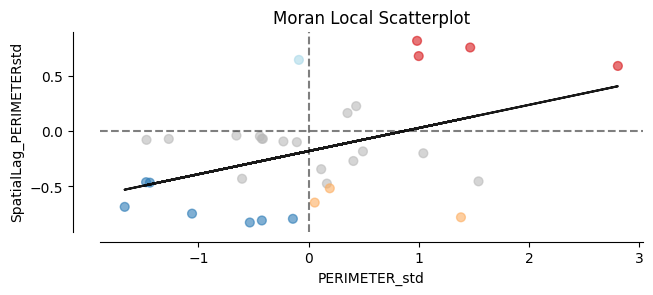

In [ ]:
#Si el punto no es gris entonces el LISA es significativo
#para perimetro
fig, ax = moran_scatterplot(lisaPERIMETER,p=0.05)
ax.set_xlabel('PERIMETER_std')
ax.set_ylabel('SpatialLag_PERIMETERstd');

In [ ]:
#b)Create a new column for each of those variables, with a label ('0 no_sig', '1 hotSpot', '2 coldOutlier', '3 coldSpot', '4 hotOutlier').

In [ ]:
#Observamos resultados de cuadrante y significancia "p"
#Para area
lisaAREA.q, lisaAREA.p_sim

(array([3, 1, 1, 3, 1, 3, 4, 1, 3, 1, 3, 4, 3, 4, 3, 3, 3, 3, 1, 4, 3, 3,
        3, 3, 2, 1, 3, 4, 3, 4, 3, 4]),
 array([0.108, 0.001, 0.001, 0.232, 0.045, 0.128, 0.19 , 0.002, 0.001,
        0.055, 0.012, 0.001, 0.001, 0.037, 0.001, 0.003, 0.004, 0.345,
        0.365, 0.037, 0.031, 0.002, 0.261, 0.07 , 0.003, 0.002, 0.313,
        0.346, 0.004, 0.002, 0.284, 0.295]))

In [ ]:
#Para perimetro
lisaPERIMETER.q, lisaPERIMETER.p_sim

(array([3, 1, 1, 3, 1, 3, 3, 1, 3, 1, 3, 3, 3, 4, 3, 4, 3, 3, 3, 4, 4, 3,
        4, 4, 2, 1, 3, 4, 3, 4, 3, 4]),
 array([0.34 , 0.003, 0.004, 0.405, 0.27 , 0.357, 0.382, 0.009, 0.001,
        0.219, 0.071, 0.001, 0.001, 0.081, 0.001, 0.01 , 0.041, 0.449,
        0.38 , 0.066, 0.047, 0.003, 0.298, 0.122, 0.02 , 0.004, 0.406,
        0.211, 0.045, 0.004, 0.425, 0.301]))

In [ ]:
#Cuadrante: 1 HH,  2 LH,  3 LL,  4 HL
#Cuadrante I (HH): hotspot
#Cuadrante II (LH): cold outlier
#Cuadrante III (LL): coldspot
#Cuadrante IV (HL): hot outlier
pd.Series(lisaAREA.q).value_counts()

,count
3,17
1,7
4,7
2,1


In [ ]:
#Cuadrante: 1 HH,  2 LH,  3 LL,  4 HL
#Cuadrante I (HH): hotspot
#Cuadrante II (LH): cold outlier
#Cuadrante III (LL): coldspot
#Cuadrante IV (HL): hot outlier
pd.Series(lisaPERIMETER.q).value_counts()

,count
3,16
4,9
1,6
2,1


In [ ]:
#Antes de usar esa información tenemos que manualmente seleccionarla pues como se ve hay "p" muy altos osea que no son estadísticamente significativos
#Para area
mexico_estados['AREA_quadrant']=[l if p <0.05 else 0 for l,p in zip(lisaAREA.q,lisaAREA.p_sim)  ]
mexico_estados['AREA_quadrant'].value_counts()

,count
AREA_quadrant,
0,13
3,9
1,5
4,4
2,1


In [ ]:
#Para perimetro
mexico_estados['PERIMETER_quadrant']=[l if p <0.05 else 0 for l,p in zip(lisaPERIMETER.q,lisaPERIMETER.p_sim)  ]
mexico_estados['PERIMETER_quadrant'].value_counts()

,count
PERIMETER_quadrant,
0,17
3,7
1,4
4,3
2,1


In [ ]:
#Asignandole un nombre
labels = [ '0 no_sig', '1 hotSpot', '2 coldOutlier', '3 coldSpot', '4 hotOutlier']
#Para area
mexico_estados['AREA_quadrant_names']=[labels[i] for i in mexico_estados['AREA_quadrant']]
mexico_estados['AREA_quadrant_names'].value_counts()

,count
AREA_quadrant_names,
0 no_sig,13
3 coldSpot,9
1 hotSpot,5
4 hotOutlier,4
2 coldOutlier,1


In [ ]:
#Para perimetro
mexico_estados['PERIMETER_quadrant_names']=[labels[i] for i in mexico_estados['PERIMETER_quadrant']]
mexico_estados['PERIMETER_quadrant_names'].value_counts()

,count
PERIMETER_quadrant_names,
0 no_sig,17
3 coldSpot,7
1 hotSpot,4
4 hotOutlier,3
2 coldOutlier,1


In [ ]:
#c)Prepare a map for each of the variables analyzed, showing the spots and outliers.

In [ ]:
!pip install matplotlib

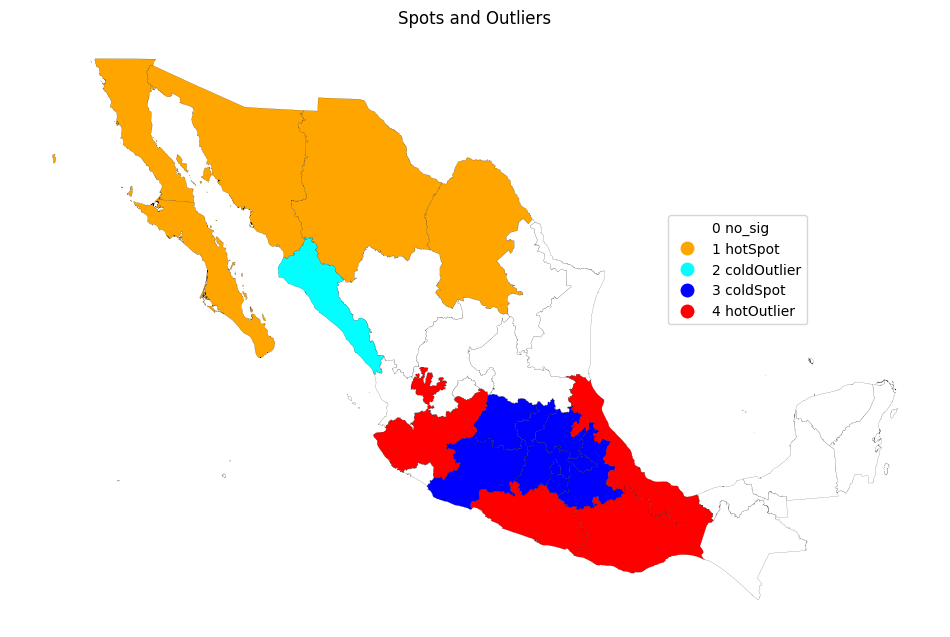

In [ ]:
#Para area
from matplotlib import colors
import matplotlib.pyplot as plt
soyelmapa = colors.ListedColormap([ 'white', 'orange', 'cyan', 'blue','red'])
f, ax = plt.subplots(1, figsize=(12,12))
plt.title('Spots and Outliers')
mexico_estados.plot(column='AREA_quadrant_names',
                categorical=True,
                cmap=soyelmapa,
                linewidth=0.1,
                edgecolor='k',
                legend=True,
                legend_kwds={'loc': 'center left',
                             'bbox_to_anchor': (0.7, 0.6)},
                ax=ax)
ax.set_axis_off()
plt.show()

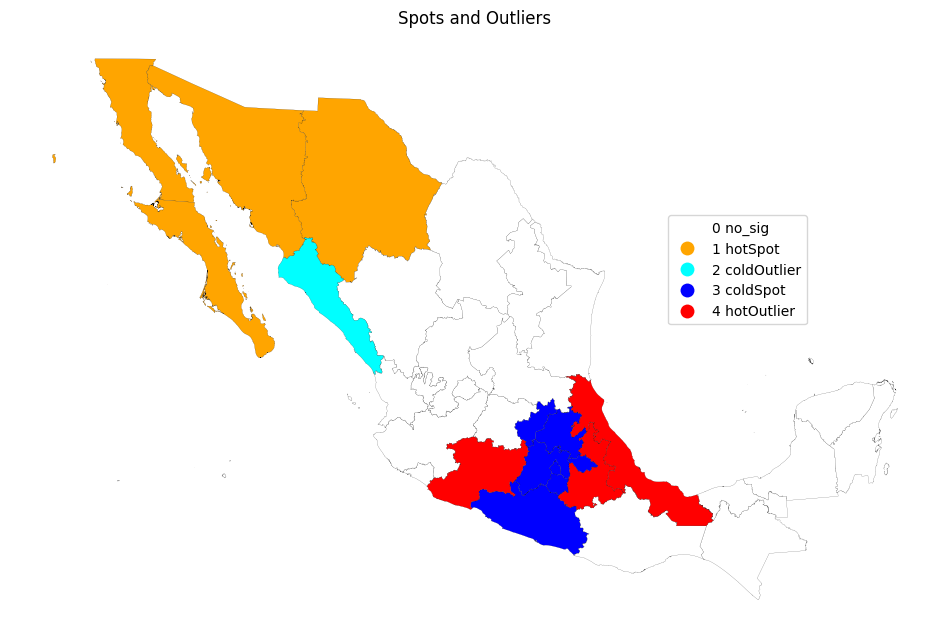

In [ ]:
#Para perimetro
from matplotlib import colors
import matplotlib.pyplot as plt
soyelmapa = colors.ListedColormap([ 'white', 'orange', 'cyan', 'blue','red'])
f, ax = plt.subplots(1, figsize=(12,12))
plt.title('Spots and Outliers')
mexico_estados.plot(column='PERIMETER_quadrant_names',
                categorical=True,
                cmap=soyelmapa,
                linewidth=0.1,
                edgecolor='k',
                legend=True,
                legend_kwds={'loc': 'center left',
                             'bbox_to_anchor': (0.7, 0.6)},
                ax=ax)
ax.set_axis_off()
plt.show()

Pregunta 9

In [ ]:
#Mining de varias variables
import os
import geopandas as gpd
import pandas as pd
from google.colab import drive
from IPython.display import display
!pip install fiona

In [ ]:
from fiona import listlayers
drive.mount('/content/drive')
link_world_map = "/content/drive/My Drive/SHAPEFILE/MAPA6362.gpkg"
listlayers(link_world_map)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


['México',
 'Estados de México',
 'Municipios de México',
 'Ríos de México',
 'Estados_de_México',
 'Municipalidades_de_México',
 'aeropuerto',
 'Aereopuertos de Mexico',
 'aaeropuertointento']

In [ ]:
link_cvs='/content/drive/MyDrive/SHAPEFILE/municipios_poblacion.csv'
poblacion2010=pd.read_csv(link_cvs, encoding='latin1')

In [ ]:
mexico_municipalities=gpd.read_file(link_world_map,layer='Municipalidades_de_México')

In [ ]:
mexico_municipalities=mexico_municipalities.merge(poblacion2010,left_on='NOMGEO',right_on='Municipio')

In [ ]:
import seaborn as sea
selected_variables = ['AREA', 'PERIMETER', 'Poblacion']

<Axes: >

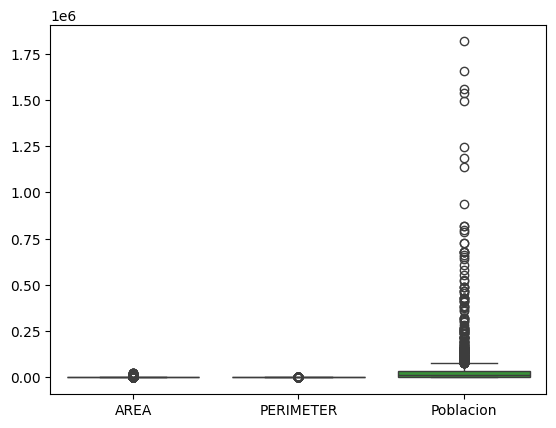

In [ ]:
sea.boxplot(mexico_municipalities[selected_variables])

In [ ]:
mexico_municipalities[selected_variables].corr()

,AREA,PERIMETER,Poblacion
AREA,1.000000,0.857390,0.100002
PERIMETER,0.857390,1.000000,0.136985
Poblacion,0.100002,0.136985,1.000000


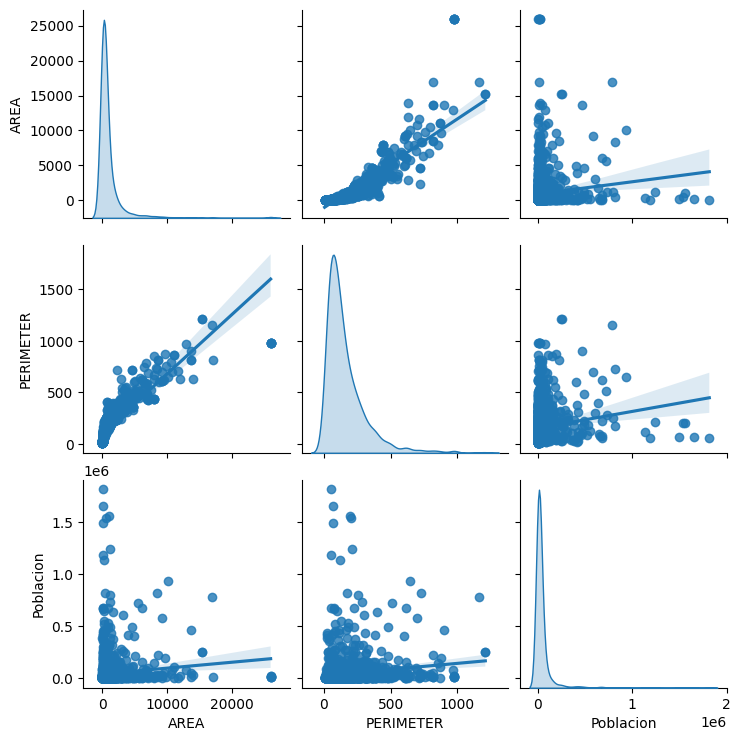

In [ ]:
sea.pairplot(
    mexico_municipalities[selected_variables], kind="reg", diag_kind="kde"
)

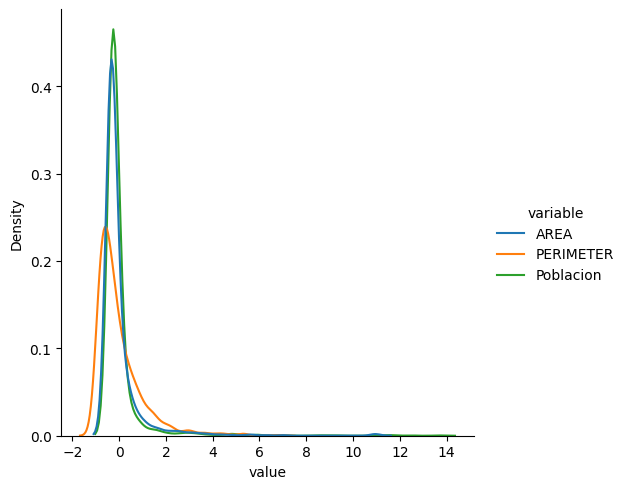

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
norm_data= scaler.fit_transform(mexico_municipalities[selected_variables])
sea.displot(pd.melt(pd.DataFrame(norm_data,columns=selected_variables)),
            x="value", hue="variable",kind="kde",
            log_scale=(False,False))

In [ ]:
selected_variables_new_std=[s+'_std' for s in selected_variables]
mexico_municipalities[selected_variables_new_std]=norm_data

In [ ]:
mexico_municipalities['AREA_std']=-1*mexico_municipalities.AREA_std

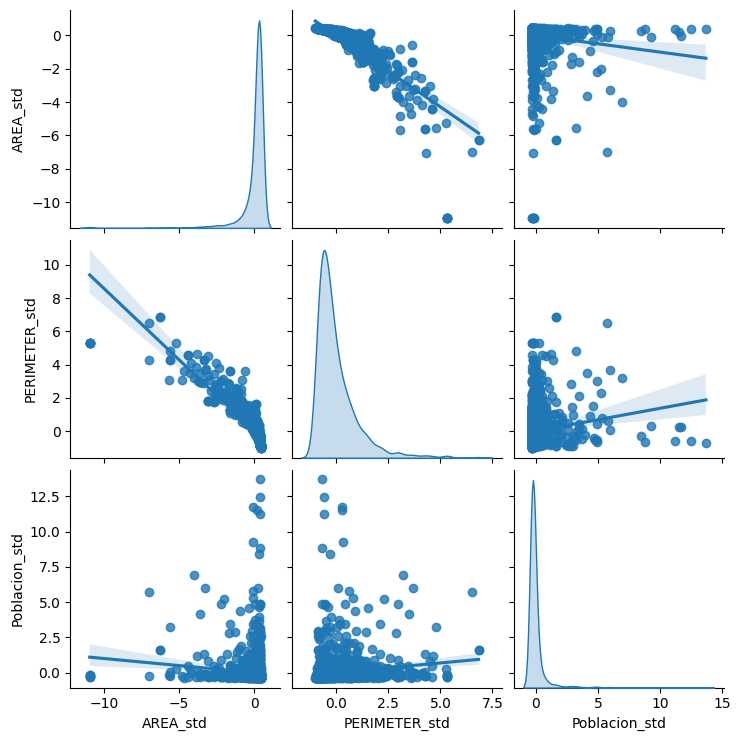

In [ ]:
new_selected_variables_std =['AREA_std', 'PERIMETER_std', 'Poblacion_std']
sea.pairplot(
    mexico_municipalities[new_selected_variables_std], kind="reg", diag_kind="kde"
)

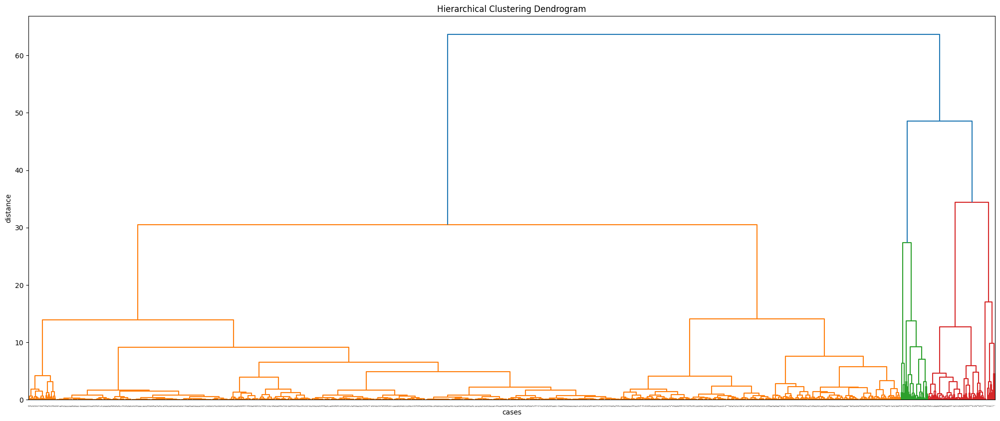

In [ ]:
from scipy.cluster import hierarchy as hc
from matplotlib import colors
import matplotlib.pyplot as plt

Z = hc.linkage(mexico_municipalities[new_selected_variables_std], 'ward')
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('cases')
plt.ylabel('distance')
hc.dendrogram(
    Z,
    leaf_rotation=90.,
    leaf_font_size=1
)
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering as agnes

import numpy as np
np.random.seed(6362)

In [ ]:
model = agnes(linkage="ward", n_clusters=6).fit(mexico_municipalities[new_selected_variables_std])

In [ ]:
mexico_municipalities["agn6"] = model.labels_
mexico_municipalities["agn6"].value_counts()


,count
agn6,
1,1158
2,549
3,109
4,45
0,22
5,8


In [ ]:
mexico_municipalities.groupby("agn6")[new_selected_variables_std].mean()


,AREA_std,PERIMETER_std,Poblacion_std
agn6,,,
0,-6.853777,4.790808,0.444340
1,0.353190,-0.549379,-0.151151
2,-0.080195,0.481731,-0.146991
3,-1.806835,2.219955,-0.007427
4,-0.424125,0.585651,3.547143
5,0.230842,-0.252042,10.892891


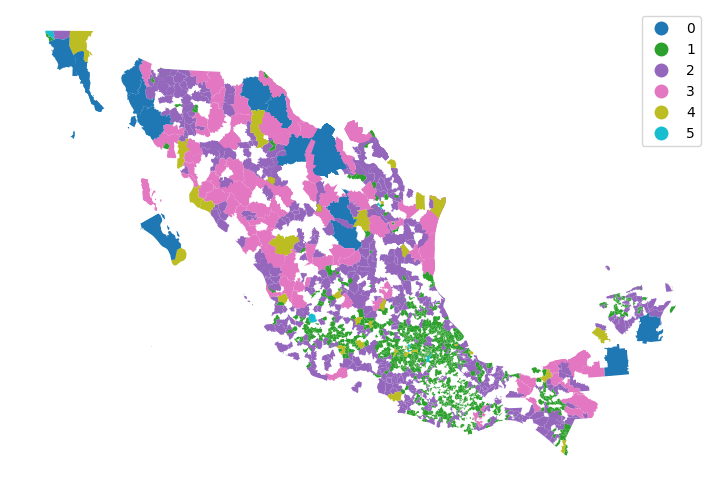

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
mexico_municipalities.plot(
    column="agn6", categorical=True, legend=True, linewidth=0, ax=ax
)
ax.set_axis_off()

In [ ]:
plt.show()

In [ ]:
from libpysal.weights import Queen, Rook, KNN
w_queen = Queen.from_dataframe(mexico_municipalities,use_index=False)
w_knn8 = KNN.from_dataframe(mexico_municipalities, k=8)

In [ ]:
modelo_q= agnes(linkage="ward",
                    n_clusters=6,
                    connectivity=w_queen.sparse).fit(mexico_municipalities[new_selected_variables_std])
mexico_municipalities["agn6_wQueen"] = modelo_q.labels_

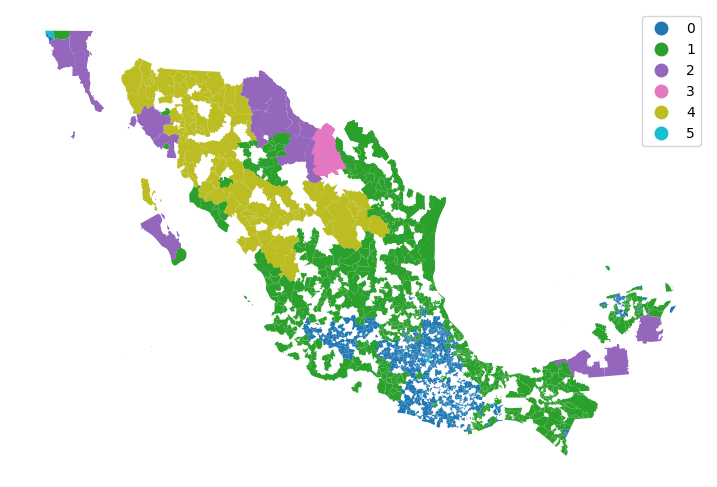

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
mexico_municipalities.plot(
    column="agn6_wQueen",
    categorical=True,
    legend=True,
    linewidth=0,
    ax=ax,
)
ax.set_axis_off()
plt.show()

In [ ]:
model_wknn8 = agnes(linkage="ward",
                    n_clusters=6,
                    connectivity=w_knn8.sparse).fit(mexico_municipalities[selected_variables_new_std])
mexico_municipalities["agn6_wknn8"] = model_wknn8.labels_

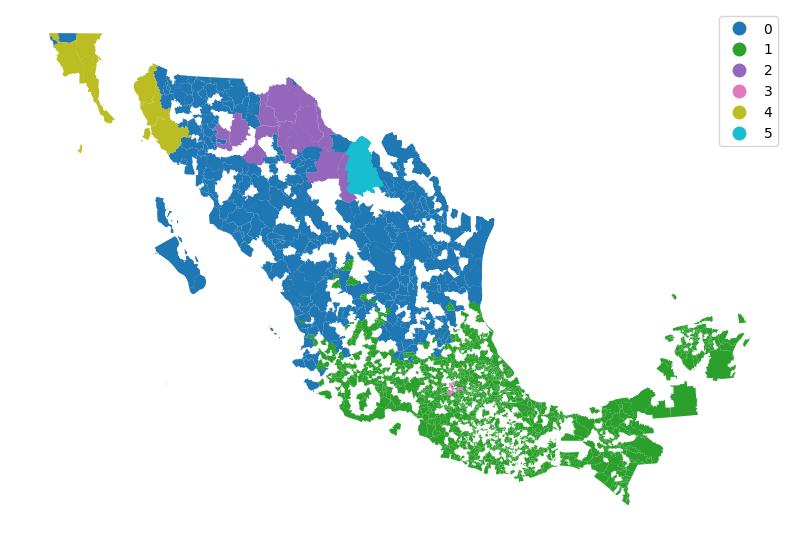

In [ ]:
f, ax = plt.subplots(1, figsize=(10, 12))
mexico_municipalities.plot(
    column="agn6_wknn8",
    categorical=True,
    legend=True,
    linewidth=0,
    ax=ax,
)
ax.set_axis_off()
plt.show()


In [ ]:
!pip install esda

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.8/142.8 kB 4.4 MB/s eta 0:00:00


In [ ]:
from esda import shape as shapestats
results={}
for cluster_type in ("agn6_wknn8", "agn6"):
    regions = mexico_municipalities[[cluster_type, "geometry"]].to_crs(6362).dissolve(by=cluster_type)
    ipqs = shapestats.isoperimetric_quotient(regions)
    result = {cluster_type:ipqs}
    results.update(result)
pd.DataFrame(results)

,agn6_wknn8,agn6
0,0.006729,0.021132
1,0.001805,0.001171
2,0.067308,0.001581
3,0.092727,0.005388
4,0.060198,0.009009
5,0.342337,0.053237


In [ ]:
from esda import shape as shapestats
results={}
for cluster_type in ("agn6_wknn8", "agn6"):
    regions = mexico_municipalities[[cluster_type, "geometry"]].to_crs(6362).dissolve(by=cluster_type)
    chullr = shapestats.convex_hull_ratio(regions)
    result = {cluster_type:chullr}
    results.update(result)
pd.DataFrame(results)

,agn6_wknn8,agn6
0,0.399098,0.095329
1,0.257714,0.066796
2,0.612444,0.148734
3,0.448166,0.186748
4,0.320222,0.036995
5,0.803272,0.004326


In [ ]:
from sklearn import metrics

fit_scores = []
for cluster_type in ("agn6_wknn8", "agn6"):
    ch_score = metrics.calinski_harabasz_score(
        mexico_municipalities[new_selected_variables_std],
        mexico_municipalities[cluster_type],
    )
    sil_score = metrics.silhouette_score(
        mexico_municipalities[new_selected_variables_std],
        mexico_municipalities[cluster_type],
    )
    fit_scores.append((cluster_type, ch_score,sil_score))


pd.DataFrame(
    fit_scores, columns=["cluster type", "CH score", "SIL score"]
).set_index("cluster type")


,CH score,SIL score
cluster type,,
agn6_wknn8,341.425427,0.404296
agn6,1691.112909,0.493975


Pregunta 10

In [ ]:
!pip install pysal

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.6/141.6 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53.9 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.1/243.1 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.8/322.8 kB 20.3 MB/s eta 0:00:00
   ━━━━━

In [ ]:
from pysal.model import spreg
dep_var_name=['PERIMETER']
ind_vars_names=['AREA','Poblacion']

In [ ]:
labels=['Lack Basic Needs %','High-School completed %', 'No H-Hold sanitation %']

ols_model = spreg.OLS(
    mexico_municipalities[dep_var_name].values,
    mexico_municipalities[ind_vars_names].values,
    name_y=labels[0],
    name_x=labels[1:],
    name_ds='datadisMap')

print(ols_model.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :  datadisMap
Weights matrix      :        None
Dependent Variable  :Lack Basic Needs %                Number of Observations:        1891
Mean dependent var  :    161.5384                Number of Variables   :           3
S.D. dependent var  :    153.1833                Degrees of Freedom    :        1888
R-squared           :      0.7378
Adjusted R-squared  :      0.7375
Sum squared residual: 1.16297e+07                F-statistic           :   2655.8843
Sigma-square        :    6159.790                Prob(F-statistic)     :           0
S.E. of regression  :      78.484                Log likelihood        :  -10931.954
Sigma-square ML     :    6150.018                Akaike info criterion :   21869.907
S.E of regression ML:     78.4220                Schwarz criterion     :   21886.542

------------------------------------------------------

In [ ]:
from esda.moran import Moran

moranNBI = Moran(mexico_municipalities[dep_var_name], w_knn8)
moranNBI.I,moranNBI.p_sim
moranError = Moran(ols_model.u, w_knn8)
moranError.I,moranError.p_sim

(np.float64(0.49584336976191185), np.float64(0.001))

In [ ]:
SAC_model = spreg.ML_Lag(
    mexico_municipalities[dep_var_name].values,
    mexico_municipalities[ind_vars_names].values,
    w=w_knn8,
    name_y=labels[0],
    name_x=labels[1:],
    name_w='KNN8',
    name_ds='mexico_municipalities'
    )

print(SAC_model.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)
-----------------------------------------------------------------
Data set            :mexico_municipalities
Weights matrix      :        KNN8
Dependent Variable  :Lack Basic Needs %                Number of Observations:        1891
Mean dependent var  :    161.5384                Number of Variables   :           4
S.D. dependent var  :    153.1833                Degrees of Freedom    :        1887
Pseudo R-squared    :      0.8046
Spatial Pseudo R-squared:  0.7167
Log likelihood      : -10676.5535
Sigma-square ML     :   4583.8492                Akaike info criterion :   21361.107
S.E of regression   :     67.7041                Schwarz criterion     :   21383.286

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------

In [ ]:
SER_model = spreg.ML_Error(
    mexico_municipalities[dep_var_name].values,
    mexico_municipalities[ind_vars_names].values,
    w=w_knn8,
    name_y=labels[0],
    name_x=labels[1:],
    name_w='KNN8',
    name_ds='mexico_municipalities'
    )

print(SER_model.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :mexico_municipalities
Weights matrix      :        KNN8
Dependent Variable  :Lack Basic Needs %                Number of Observations:        1891
Mean dependent var  :    161.5384                Number of Variables   :           3
S.D. dependent var  :    153.1833                Degrees of Freedom    :        1888
Pseudo R-squared    :      0.7378
Log likelihood      : -10433.6796
Sigma-square ML     :   3291.9433                Akaike info criterion :   20873.359
S.E of regression   :     57.3755                Schwarz criterion     :   20889.994

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT     

In [ ]:
SAC_model = spreg.GM_Combo_Het(
    mexico_municipalities[dep_var_name].values,
    mexico_municipalities[ind_vars_names].values,
    w=w_knn8,
    name_y=labels[0],
    name_x=labels[1:],
    name_w='KNN8',
    name_ds='mexico_municipalities'
)

print(SAC_model.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS- GM-COMBO MODEL (HET)
----------------------------------------------------------------
Data set            :mexico_municipalities
Weights matrix      :        KNN8
Dependent Variable  :Lack Basic Needs %                Number of Observations:        1891
Mean dependent var  :    161.5384                Number of Variables   :           4
S.D. dependent var  :    153.1833                Degrees of Freedom    :        1887
Pseudo R-squared    :      0.7395
Spatial Pseudo R-squared:  0.7379
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       123.26765        41.52102         2.96880         0.00299